In [1]:
%load_ext autoreload
%autoreload 2
from physics_data import generate_harmonic_data
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import json

In [3]:
from PhysicsDatasets import SHODataset
masses = [(0.1,10)]
dset = SHODataset(masses=masses,k=10.0,dt=0.1,num_trajectories=5,seq_len=50)
p,t = dset.xt, dset.time

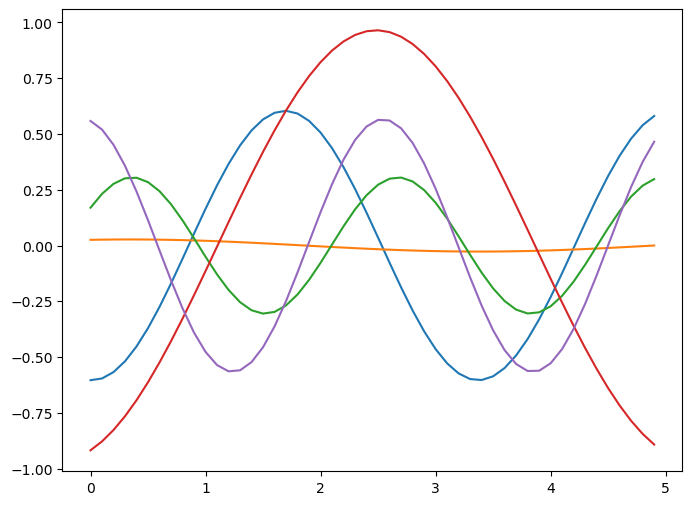

In [9]:
plt.figure(figsize=(8,6))
l = plt.plot(t.T,p.squeeze(-1).T)

In [10]:
dset.masses

tensor([2.8555, 9.3560, 1.3525, 7.7163, 1.7261])

In [11]:
print(dset.masses[1],dset.x0[1],dset.v0[1])

tensor(9.3560) tensor(0.0255) tensor(0.0097)


# very small model

In [139]:
from model import GPT, GPTConfig
model_cfg = dict(
    block_size=1024, # maximum sequence length?
    input_dim=1, # default to 1d time-series data
    context_dim=3, # dimension of context vector (initial conditions)
    n_layer=6,
    n_head=4,
    n_embd=64, # embedding dimensions
    dropout=0.0,
    bias=False
)

# define model
gpt_config = GPTConfig(**model_cfg)
model = GPT(gpt_config)
model.load_state_dict(torch.load("trainings/random_SHO_05Dec24_1118/random_SHO_05Dec24_1118_best.pt",map_location='cpu'))

number of parameters: 0.30M


/tmp/ipykernel_2776170/1043745846.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("trainings/random_SHO_05Dec24_1118/random_SHO_05Dec24

<All keys matched successfully>

In [200]:
from physics_data import RandomSHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 350
n_seq = 20
val_data = RandomSHODataset(masses,n_seq,max_seq_length,0.1)

x = val_data.time_series
ctx = val_data.context

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

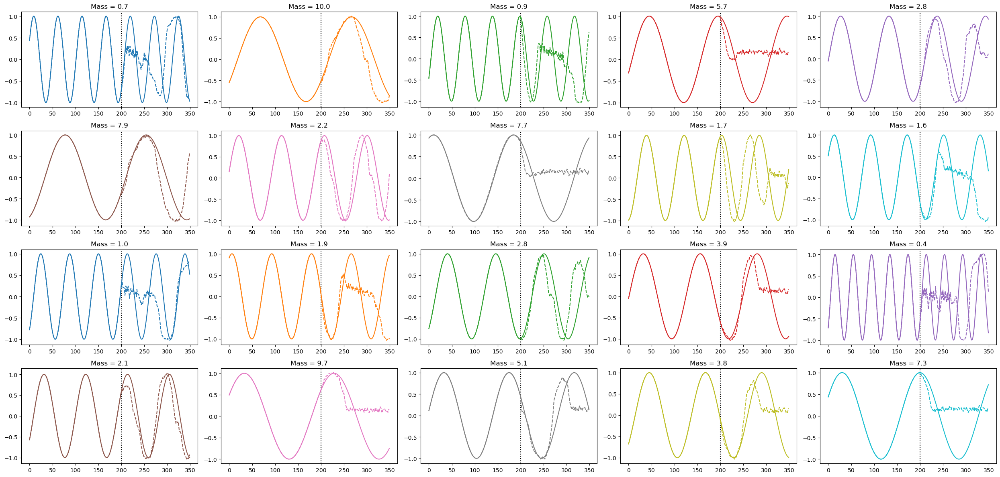

In [201]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])
tpred = np.arange(xpred.shape[-1])

masses = val_data.rand_masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(200,color='k',linestyle=':',zorder=0)
plt.tight_layout()
plt.savefig("randMasses_timeSeries_smallTest.png")

In [158]:
from physics_data import SHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 350
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1)

x,tgt,ctx,mask = val_data[:]
x = val_data.time_series

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

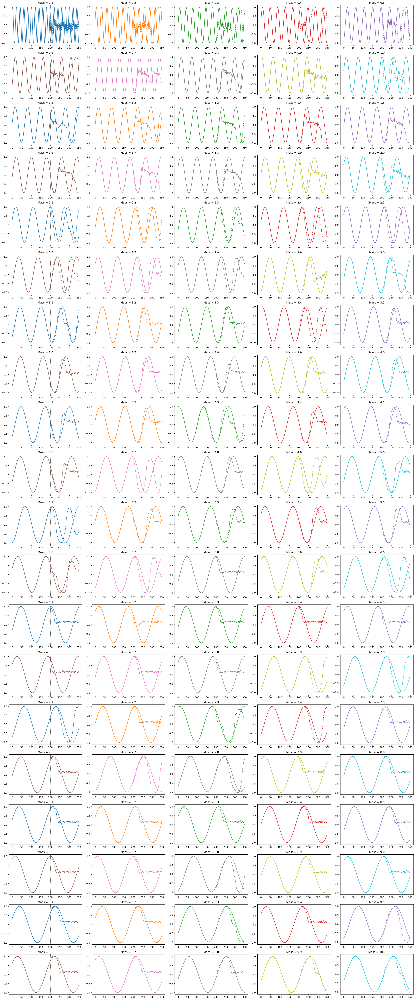

In [176]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])
tpred = np.arange(xpred.shape[-1])

masses = val_data.masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(200,color='k',linestyle=':',zorder=0)
plt.tight_layout()
plt.savefig("allMasses_timeSeries_smallTest.png")

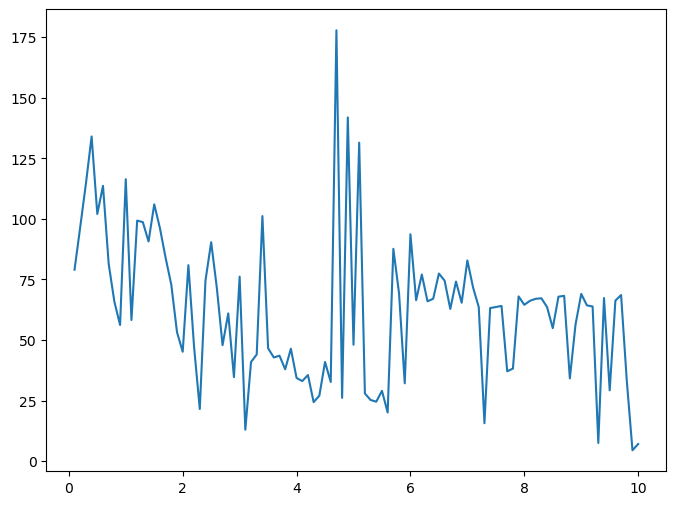

In [177]:
plt.figure(figsize=(8,6))
mses = []
for idx in range(xref.shape[0]):
    m = masses[idx]
    true = xref[idx,200:]
    pred = xpred[idx,200:]
    mse = ((true-pred)**2).sum()
    mses.append(mse)
plt.plot(masses,mses)

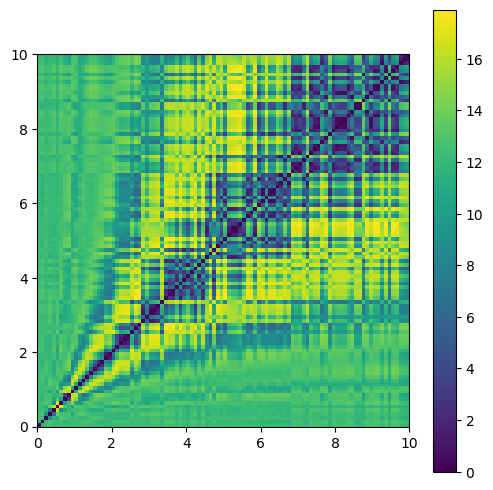

In [195]:
d = torch.cdist(xref[:,200:],xref[:,200:],p=2)
plt.figure(figsize=(6,6))
plt.imshow(d.T,extent=[0,10,0,10],origin='lower')
plt.colorbar()

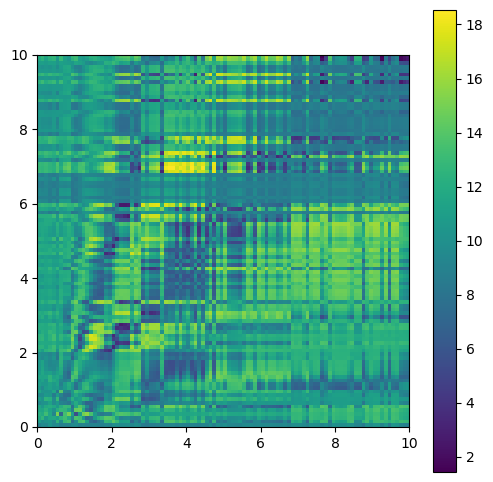

In [196]:
d = torch.cdist(xref[:,200:],xpred[:,200:],p=2)
plt.figure(figsize=(6,6))
plt.imshow(d.T,extent=[0,10,0,10],origin='lower')
plt.colorbar()

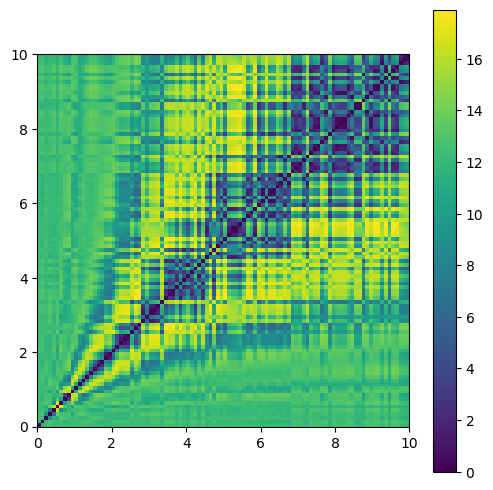

In [197]:
d = torch.cdist(xref[:,200:],xref[:,200:],p=2)
plt.figure(figsize=(6,6))
plt.imshow(d.T,extent=[0,10,0,10],origin='lower')
plt.colorbar()

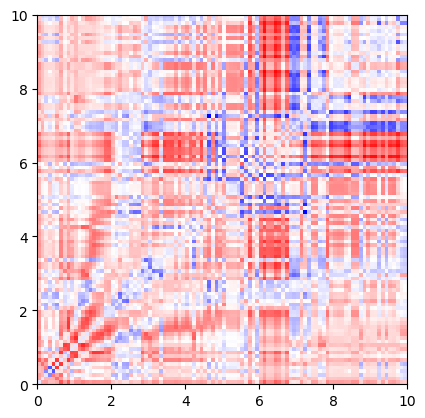

In [198]:
d1 = torch.cdist(xref[:,200:],xref[:,200:],p=2)
d2 = torch.cdist(xpred[:,200:],xpred[:,200:],p=2)
plt.imshow((d1-d2).T,extent=[0,10,0,10],origin='lower',cmap='bwr')

# slightly larger model & more epochs

In [210]:
from model import GPT, GPTConfig
src = "trainings/random_SHO_05Dec24_1414/"
with open(f"{src}/model_cfg.json","r") as fin:
    model_cfg = json.load(fin)
# define model
gpt_config = GPTConfig(**model_cfg)
model = GPT(gpt_config)
model.load_state_dict(torch.load(f"{src}/random_SHO_05Dec24_1414_best.pt",map_location='cpu'))

number of parameters: 0.49M


/tmp/ipykernel_2776170/873875065.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{src}/random_SHO_05Dec24_1414_best.pt",map_location='

<All keys matched successfully>

In [211]:
from physics_data import RandomSHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 350
n_seq = 20
val_data = RandomSHODataset(masses,n_seq,max_seq_length,0.1)

x = val_data.time_series
ctx = val_data.context

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

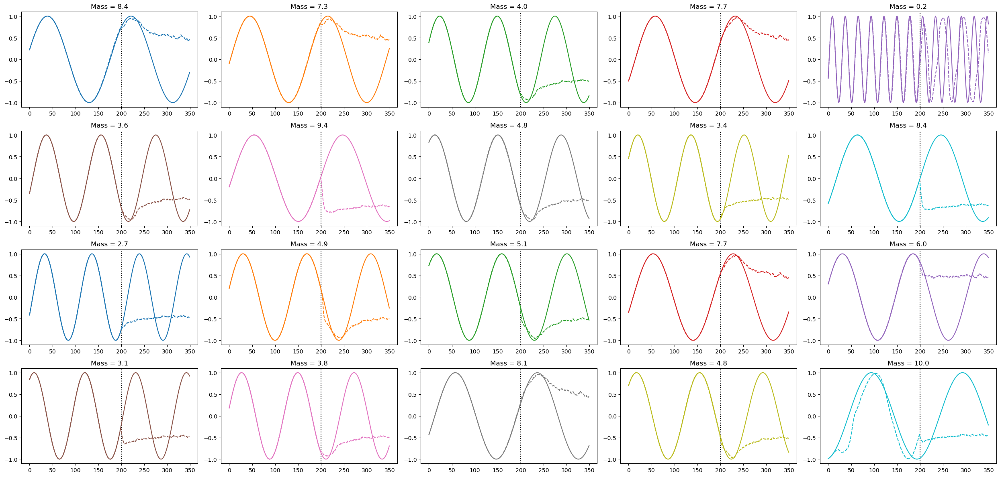

In [212]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])
tpred = np.arange(xpred.shape[-1])

masses = val_data.rand_masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(200,color='k',linestyle=':',zorder=0)
plt.tight_layout()
plt.savefig("randMasses_timeSeries_biggerTest.png")

# small model local

In [156]:
from model import GPT, GPTConfig
src = "trainings/random_SHO_06Dec24_1104/"
with open(f"{src}/model_cfg.json","r") as fin:
    model_cfg = json.load(fin)
# define model
gpt_config = GPTConfig(**model_cfg)
model = GPT(gpt_config)
model.load_state_dict(torch.load(f"{src}/random_SHO_06Dec24_1104_best.pt",map_location='cpu'))

Using positional embedding
number of parameters: 0.00M


<All keys matched successfully>

In [157]:
from physics_data import RandomSHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 75
n_seq = 20
dt = 0.1
val_data = RandomSHODataset(masses,n_seq,max_seq_length,dt,k=8.0)

x = val_data.time_series
ctx = val_data.context

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

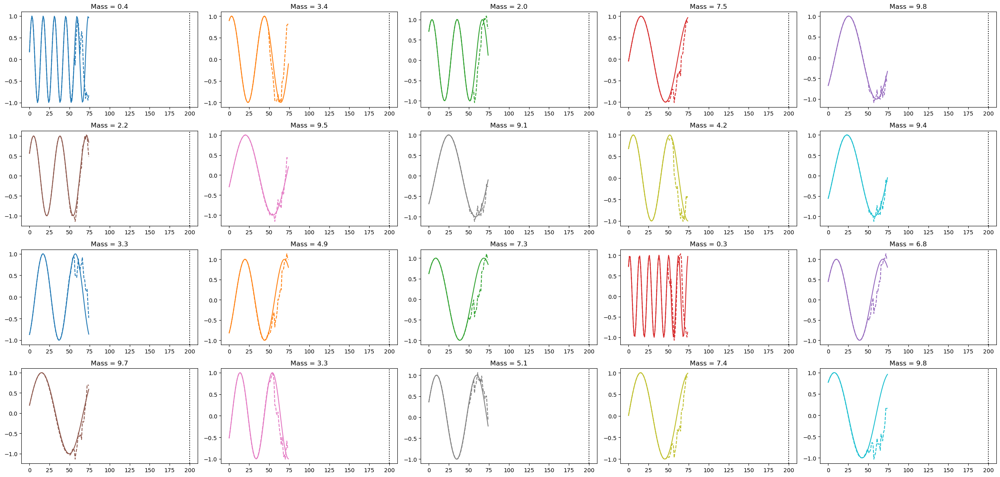

In [158]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])
tpred = np.arange(xpred.shape[-1])

masses = val_data.rand_masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(200,color='k',linestyle=':',zorder=0)
plt.tight_layout()
#plt.savefig("randMasses_timeSeries_biggerTest.png")

In [66]:
from physics_data import SHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 50
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0)

x = val_data.time_series
ctx = val_data.context

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

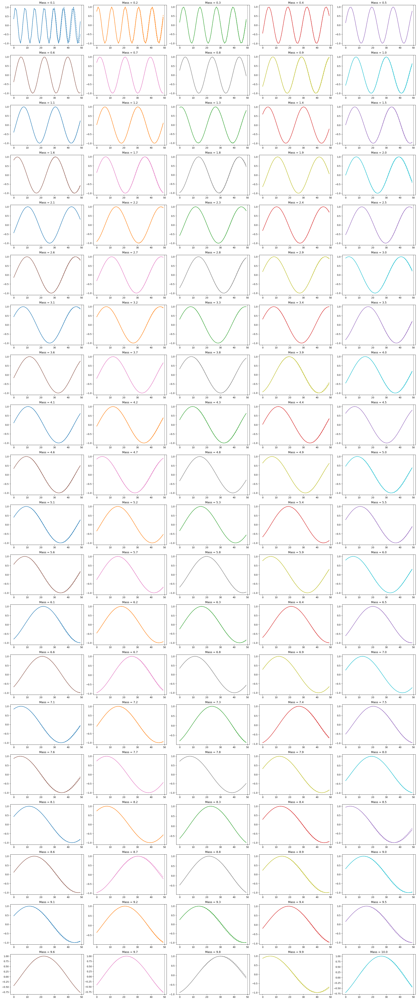

In [68]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])
tpred = np.arange(xpred.shape[-1])

masses = val_data.masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(50,color='k',linestyle=':',zorder=0)
plt.tight_layout()
plt.savefig("allMasses_timeSeries_smallTest.png")

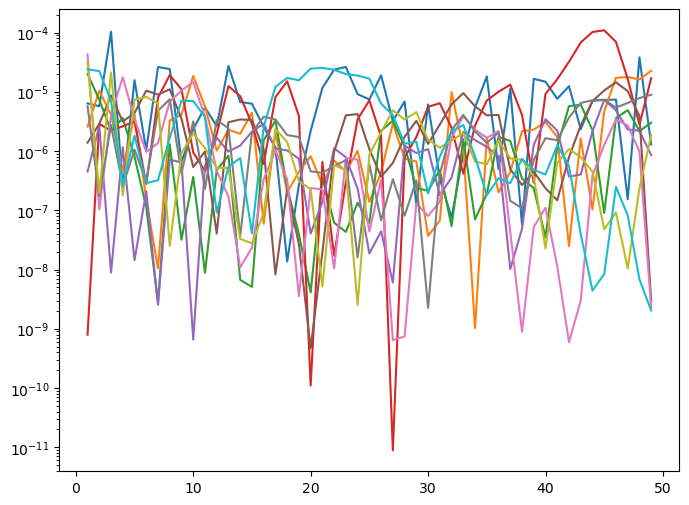

In [73]:
from physics_data import SHODataset
masses = torch.arange(1,11)
max_seq_length = 100
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0)

x = val_data.time_series
ctx = val_data.context

ctx_lengths = np.arange(1,50)
mses = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        xnext = model(xcurr,ctx)
        mse = (x[:,ctl,:]-xnext[:,-1,:])**2
        mses.append(mse)
mses = torch.cat(mses,dim=1)

plt.figure(figsize=(8,6))
for i,m in enumerate(masses):
    plt.plot(ctx_lengths,mses[i].numpy(),label=f"M = {m:.1f}")
plt.yscale('log')
#plt.legend()

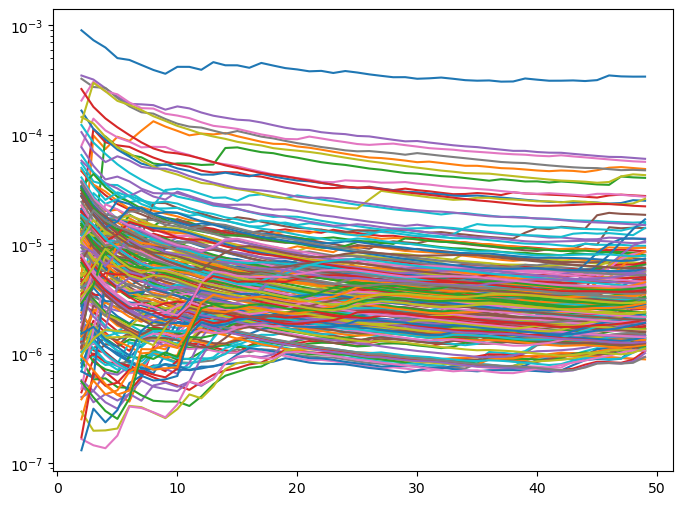

In [129]:
from physics_data import SHODataset
masses = torch.arange(0.1,10.05,0.05)
max_seq_length = 100
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0)

x = val_data.time_series
ctx = val_data.context

ctx_lengths = np.arange(2,50)
mses = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        xnext = model(xcurr,ctx)
        mse = (x[:,1:ctl+1,:]-xnext)**2
        mses.append(mse.mean(dim=1))
mses = torch.cat(mses,dim=1)

plt.figure(figsize=(8,6))
for i,m in enumerate(masses):
    plt.plot(ctx_lengths,mses[i].numpy(),label=f"M = {m:.1f}")
plt.yscale('log')
#plt.legend(loc='lower right',ncol=4)

Text(0, 0.5, 'Context Length')

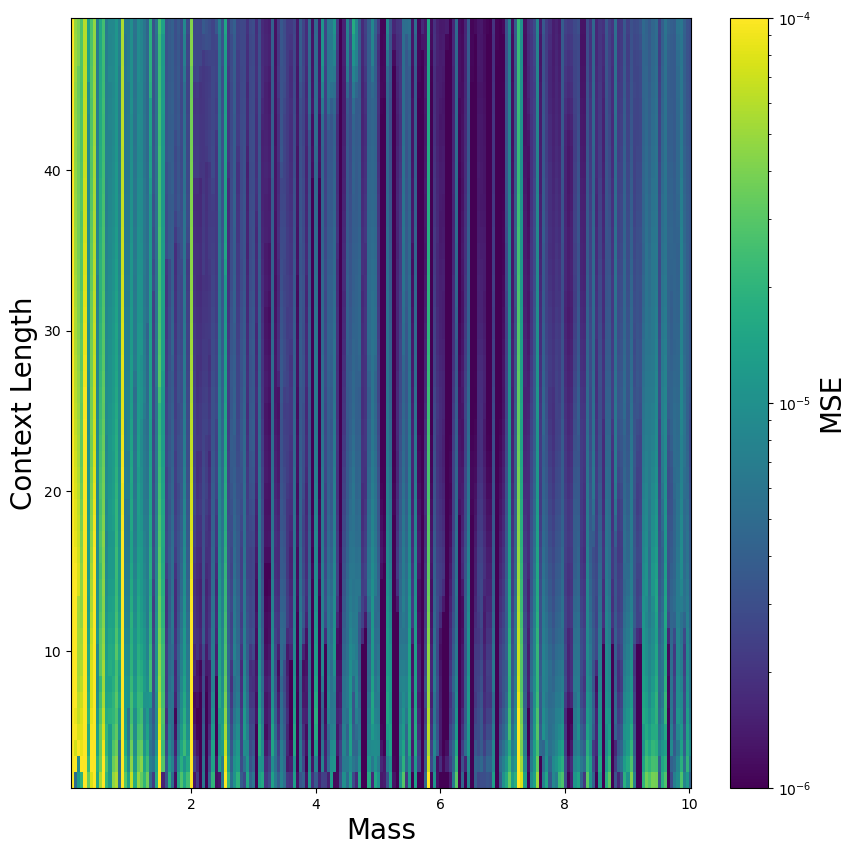

In [131]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(10,10))
extent = [masses[0]-0.5*(masses[1]-masses[0]),masses[-1]+0.5*(masses[1]-masses[0]),
          ctx_lengths[0]-0.5*(ctx_lengths[1]-ctx_lengths[0]),ctx_lengths[-1]+0.5*(ctx_lengths[1]-ctx_lengths[0])]
plt.imshow(mses.T,origin='lower',aspect='auto',norm=LogNorm(vmin=1e-6,vmax=1e-4),extent=extent,cmap='viridis')
cb = plt.colorbar()
cb.set_label(label='MSE', fontsize=20)
plt.xlabel("Mass",fontsize=20)
plt.ylabel("Context Length",fontsize=20)
#t=plt.xticks(np.arange(0.5,10.5,0.5),rotation=25)

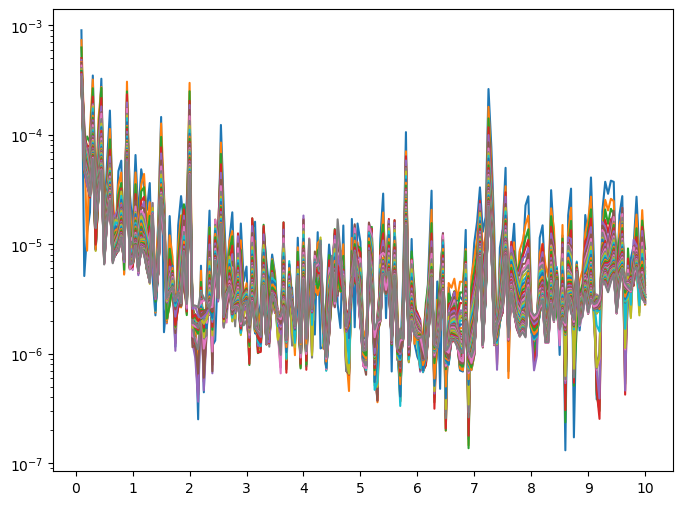

In [132]:
plt.figure(figsize=(8,6))
for i in range(len(ctx_lengths)):
    plt.plot(masses,mses[:,i])
plt.yscale('log')
t=plt.xticks(np.arange(0,11))

# small model, no positional encoding

In [112]:
from model import GPT, GPTConfig
src = "trainings/random_SHO_09Dec24_1217/"
with open(f"{src}/model_cfg.json","r") as fin:
    model_cfg = json.load(fin)
with open(f"{src}/training_cfg.json","r") as fin:
    train_cfg = json.load(fin)
# define model
gpt_config = GPTConfig(**model_cfg)
model = GPT(gpt_config)
model.load_state_dict(torch.load(f"{src}/random_SHO_09Dec24_1217_best.pt",map_location='cpu'))

number of parameters: 0.00M


<All keys matched successfully>

## plot trajectories up to t = 50 for range of masses with $x_0 = 0$

In [113]:
from PhysicsDatasets import SHODataset
masses = torch.arange(0.1,10.1,0.1)
max_seq_length = 50
n_seq = 20
k = train_cfg['k']
dt = train_cfg['dt']
val_data = SHODataset(masses=masses,seq_len=max_seq_length,dt=dt,k=k,x0=0, v0=1, pin_amplitude=1.0)

x = val_data.xt
ctx = val_data.context

tstart = 10
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

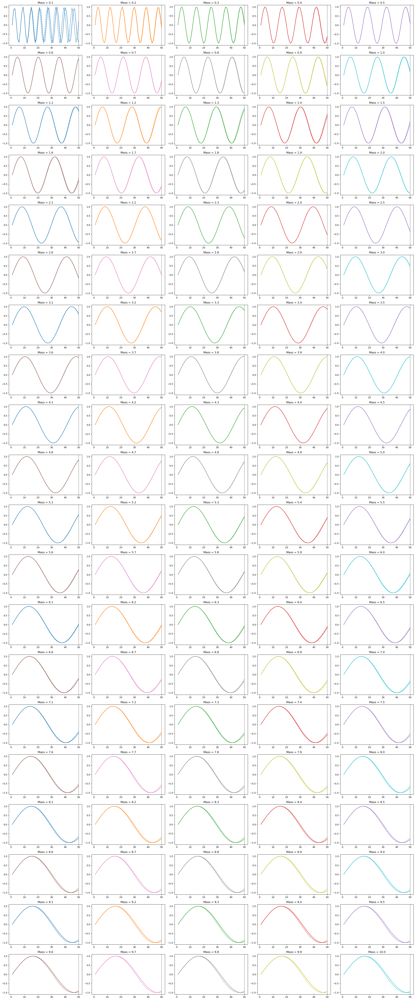

In [114]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])+1
tpred = np.arange(xpred.shape[-1])+1

masses = val_data.masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(50,color='k',linestyle=':',zorder=0)
plt.tight_layout()
#plt.savefig("allMasses_timeSeries_smallTest_noPosEnc.png")

## investigate MSE for next-pos-prediction with $x_0 = 0$

In [128]:
from PhysicsDatasets import SHODataset
masses = torch.arange(0.1,10.05,0.05)
max_seq_length = 50
n_seq = 20
val_data = SHODataset(masses=masses,seq_len=max_seq_length,dt=dt,k=k,x0=0,pin_amplitude=1.0)

x = val_data.xt
ctx = val_data.context

ctx_lengths = np.arange(2,50)
mses_mean = []
mses_final = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        xnext = model(xcurr,ctx)
        mse = (x[:,1:ctl+1,:]-xnext)**2
        mses_mean.append(mse.mean(dim=1))
        mses_final.append(mse[:,-1,:])
mses_mean = torch.cat(mses_mean,dim=1)
mses_final = torch.cat(mses_final,dim=1)

Text(0, 0.5, 'mean MSE of next pos prediction')

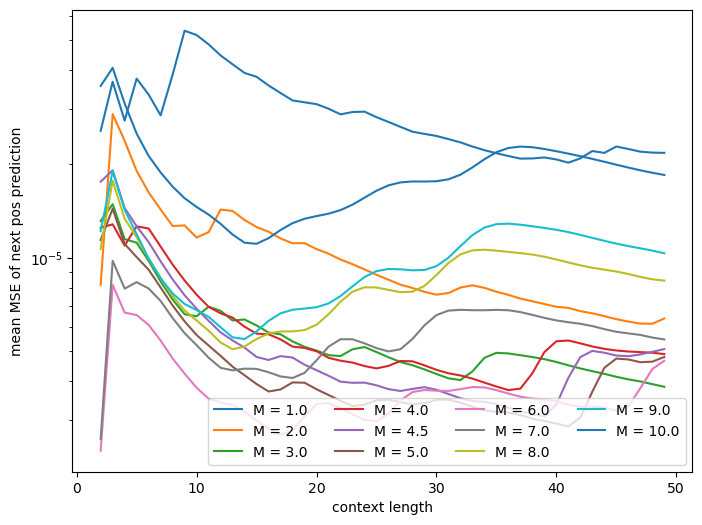

In [129]:
plt.figure(figsize=(8,6))
msel = np.concatenate([np.arange(1,5),np.array([4.5]),np.arange(5,11)])
for i,m in enumerate(masses):
    if m.item() not in msel:
        continue
    plt.plot(ctx_lengths,mses_mean[i].numpy(),label=f"M = {m:.1f}")
plt.yscale('log')
plt.legend(loc='lower right',ncol=4)
plt.xlabel("context length")
plt.ylabel("mean MSE of next pos prediction")

Text(0, 0.5, 'MSE of last pos prediction')

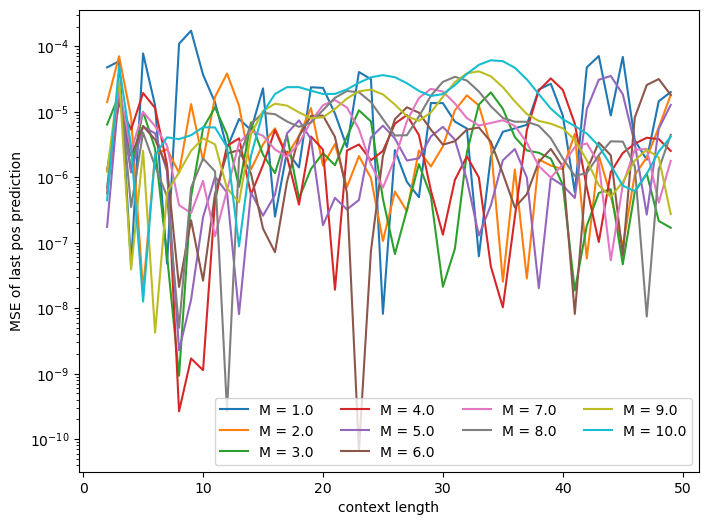

In [130]:
plt.figure(figsize=(8,6))
msel = np.arange(1,11)
for i,m in enumerate(masses):
    if m.item() not in msel:
        continue
    plt.plot(ctx_lengths,mses_final[i].numpy(),label=f"M = {m:.1f}")
plt.yscale('log')
plt.legend(loc='lower right',ncol=4)
plt.xlabel("context length")
plt.ylabel("MSE of last pos prediction")

Text(0.5, 1.0, 'x0=0')

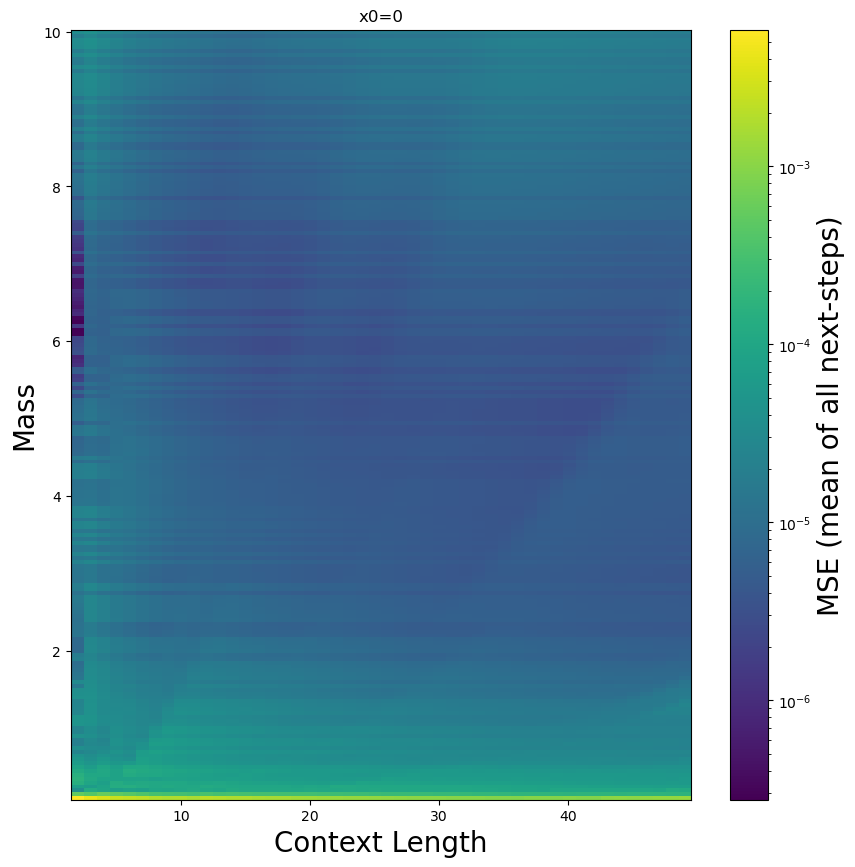

In [131]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(10,10))
extent = [ctx_lengths[0]-0.5*(ctx_lengths[1]-ctx_lengths[0]),ctx_lengths[-1]+0.5*(ctx_lengths[1]-ctx_lengths[0])] + [masses[0]-0.5*(masses[1]-masses[0]),masses[-1]+0.5*(masses[1]-masses[0])]
plt.imshow(mses_mean,origin='lower',aspect='auto',norm=LogNorm(),extent=extent,cmap='viridis')
cb = plt.colorbar()
cb.set_label(label='MSE (mean of all next-steps)', fontsize=20)
plt.ylabel("Mass",fontsize=20)
plt.xlabel("Context Length",fontsize=20)
#t=plt.xticks(np.arange(0.5,10.5,0.5),rotation=25)
plt.title("x0=0")

Text(0.5, 1.0, 'x0 = 0')

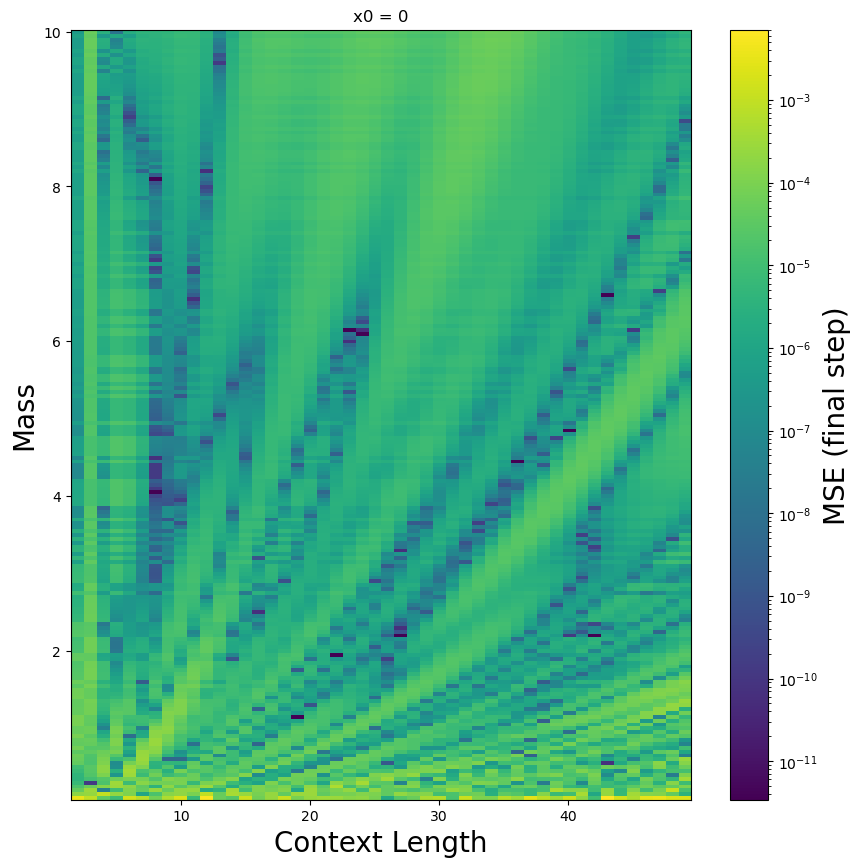

In [132]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(10,10))
extent = [ctx_lengths[0]-0.5*(ctx_lengths[1]-ctx_lengths[0]),ctx_lengths[-1]+0.5*(ctx_lengths[1]-ctx_lengths[0])] + [masses[0]-0.5*(masses[1]-masses[0]),masses[-1]+0.5*(masses[1]-masses[0])]
plt.imshow(mses_final,origin='lower',aspect='auto',norm=LogNorm(),extent=extent,cmap='viridis')
cb = plt.colorbar()
cb.set_label(label='MSE (final step)', fontsize=20)
plt.ylabel("Mass",fontsize=20)
plt.xlabel("Context Length",fontsize=20)
#t=plt.xticks(np.arange(0.5,10.5,0.5),rotation=25)
plt.title("x0 = 0")

In [136]:
a = torch.cat([dset.xt,dset.vt],dim=-1)
a.shape

torch.Size([5, 50, 2])

## fix m = 3, investigate MSE vs context for varying $x_0$

In [125]:
from PhysicsDatasets import SHODataset
#x0 = torch.arange(-1.0,1.01,0.01)
x0 = torch.arange(0,1.01,0.01)
masses = 3.0*torch.ones(x0.shape[0])
max_seq_length = 50
n_seq = 20
val_data = SHODataset(masses=masses,seq_len=max_seq_length,dt=dt,k=k,x0=x0,v0=1,pin_amplitude=1.0)

x = val_data.xt
ctx = val_data.context

ctx_lengths = np.arange(2,50)
mses_mean = []
mses_final = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        xnext = model(xcurr,ctx)
        mse = (x[:,1:ctl+1,:]-xnext)**2
        mses_mean.append(mse.mean(dim=1))
        mses_final.append(mse[:,-1,:])
mses_mean = torch.cat(mses_mean,dim=1)
mses_final = torch.cat(mses_final,dim=1)

Text(0.5, 0, 'Context Length')

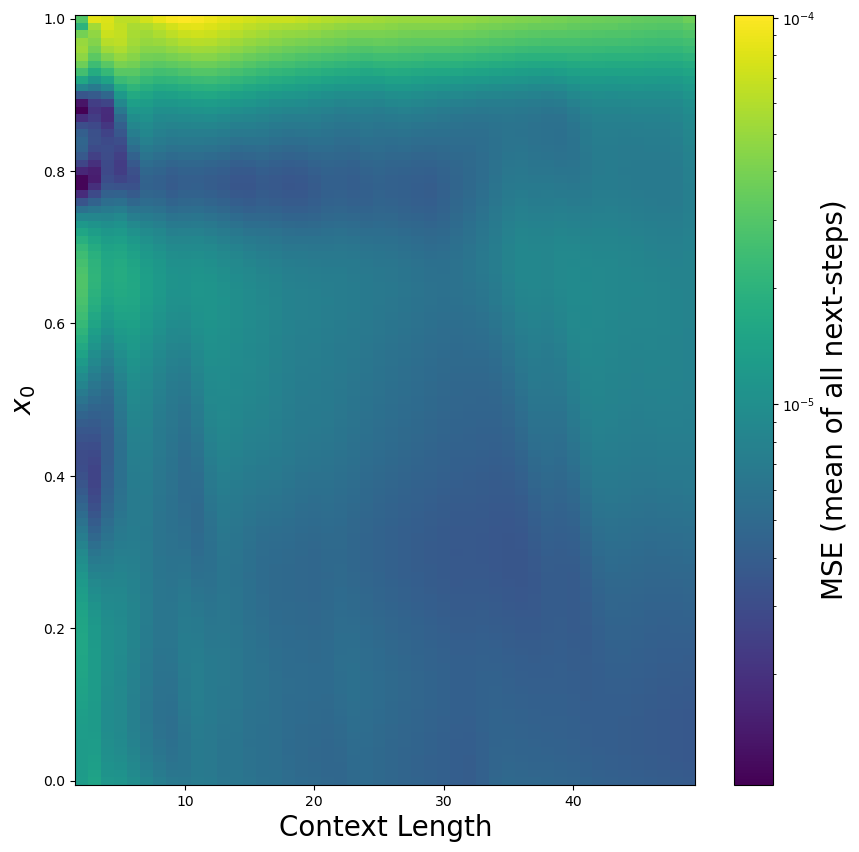

In [126]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(10,10))
extent = [ctx_lengths[0]-0.5*(ctx_lengths[1]-ctx_lengths[0]),ctx_lengths[-1]+0.5*(ctx_lengths[1]-ctx_lengths[0])] + [x0[0]-0.5*(x0[1]-x0[0]),x0[-1]+0.5*(x0[1]-x0[0])]
plt.imshow(mses_mean,origin='lower',aspect='auto',norm=LogNorm(),extent=extent,cmap='viridis')
cb = plt.colorbar()
cb.set_label(label='MSE (mean of all next-steps)', fontsize=20)
plt.ylabel("$x_0$",fontsize=20)
plt.xlabel("Context Length",fontsize=20)
#t=plt.xticks(np.arange(0.5,10.5,0.5),rotation=25)

Text(0.5, 1.0, 'x0 = 0')

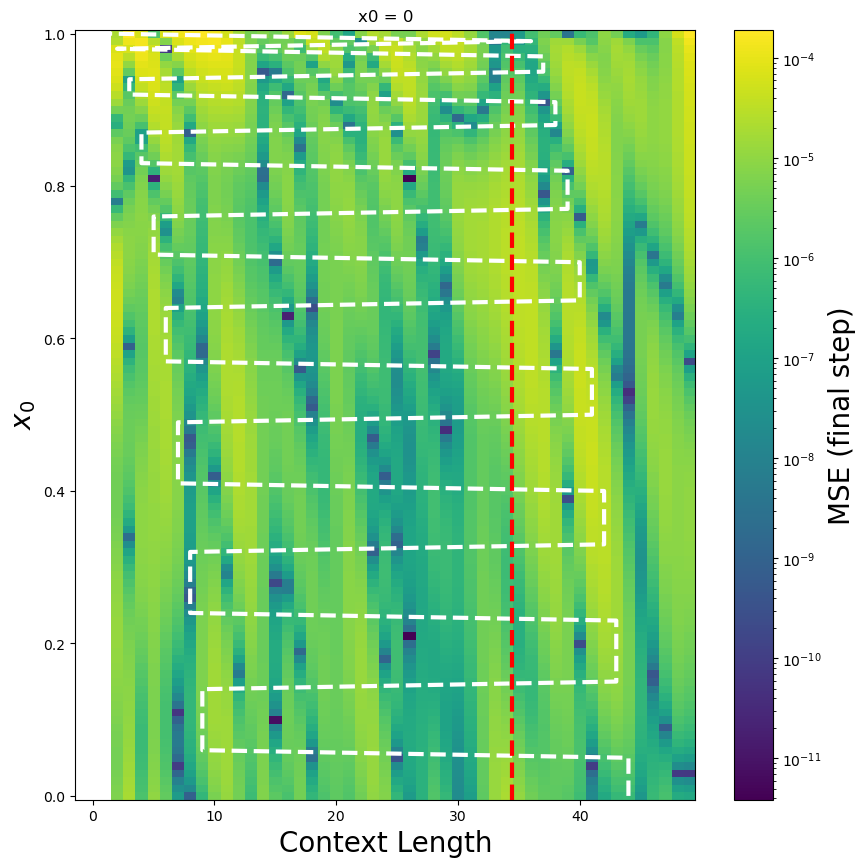

In [127]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(10,10))
extent = [ctx_lengths[0]-0.5*(ctx_lengths[1]-ctx_lengths[0]),ctx_lengths[-1]+0.5*(ctx_lengths[1]-ctx_lengths[0])] + [x0[0]-0.5*(x0[1]-x0[0]),x0[-1]+0.5*(x0[1]-x0[0])]
plt.imshow(mses_final,origin='lower',aspect='auto',norm=LogNorm(),extent=extent,cmap='viridis')
cb = plt.colorbar()
cb.set_label(label='MSE (final step)', fontsize=20)
plt.ylabel("$x_0$",fontsize=20)
plt.xlabel("Context Length",fontsize=20)
#t=plt.xticks(np.arange(0.5,10.5,0.5),rotation=25)
m = 3
k = 10
w = np.sqrt(k/m)
x0s = np.linspace(0,1,100)
phis = np.arccos(x0s)
xtarg = 1
ttarg = ((np.arccos(xtarg)+phis)/w)/dt
plt.plot(torch.argmin(torch.abs(x.squeeze(-1)-xtarg),dim=1)+1,x0,color='white',linestyle='--',lw=3)
plt.axvline((2*np.pi/w)/dt,linestyle='--',color='red',lw=3)
plt.title("x0 = 0")

## other

Text(0, 0.5, 'mean MSE of future sequence (tmax = 50)')

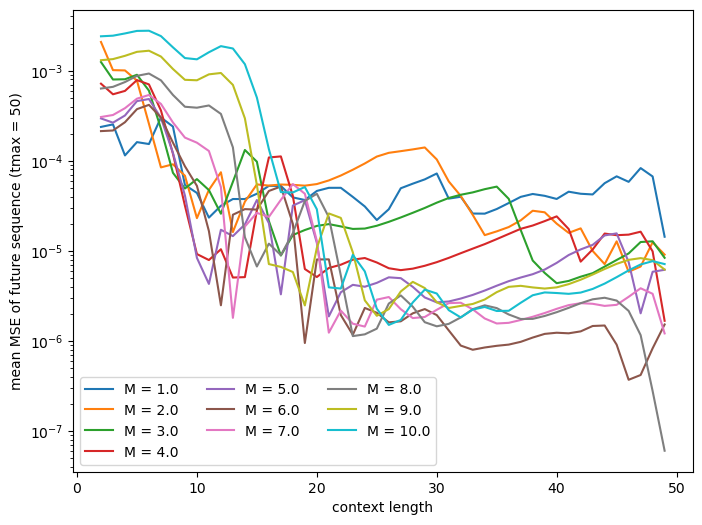

In [196]:
from physics_data import SHODataset
masses = torch.arange(0.1,10.05,0.05)
max_seq_length = 50
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0,x0=0)

x = val_data.time_series
ctx = val_data.context

ctx_lengths = np.arange(2,50)
mses = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        for n in range(max_seq_length-ctl):
            xnext = model(xcurr,ctx)
            xcurr = torch.cat([xcurr,xnext[:,-1:,:]],dim=1)
        mse = (x[:,ctl:,:]-xcurr[:,ctl:,:])**2
        mses.append(mse.mean(dim=1))
mses = torch.cat(mses,dim=1)

plt.figure(figsize=(8,6))
msel = np.arange(1.0,11.0)
for i,m in enumerate(masses):
    if m.item() not in msel:
        continue
    plt.plot(ctx_lengths,mses[i].numpy(),label=f"M = {m:.1f}")
plt.yscale('log')
plt.legend(loc='lower left',ncol=3)
plt.xlabel("context length")
plt.ylabel("mean MSE of future sequence (tmax = 50)")

In [184]:
from physics_data import SHODataset
masses = torch.arange(0.1,10.05,0.05)
max_seq_length = 50
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0,x0=0)

x = val_data.time_series
ctx = val_data.context

ctx_lengths = np.arange(2,50)
mses = []
with torch.no_grad():
    for ctl in ctx_lengths:
        xcurr = x[:,:ctl,:]
        for n in range(max_seq_length-ctl):
            xnext = model(xcurr,ctx)
            xcurr = torch.cat([xcurr,xnext[:,-1:,:]],dim=1)
        mse = (x[:,ctl:,:]-xcurr[:,ctl:,:])**2
        mses.append(mse)

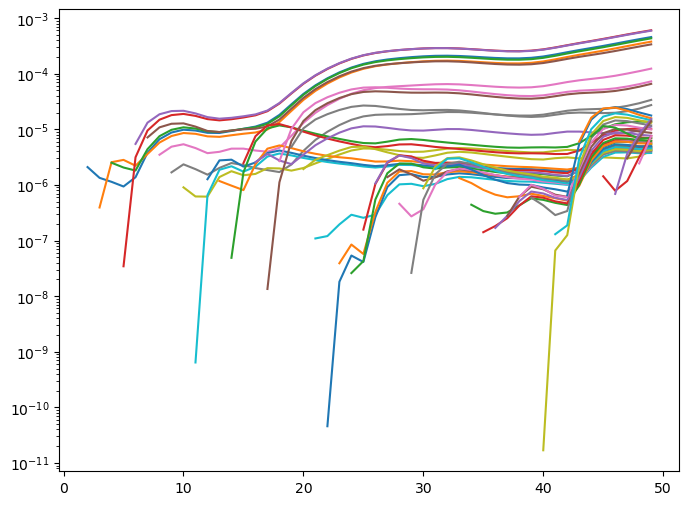

In [185]:
plt.figure(figsize=(8,6))
for j,m in enumerate(masses):
    if m != 4.5:
        continue
    for i,ctl in enumerate(ctx_lengths):
        m = mses[i].squeeze(-1)[j]
        plt.plot(np.arange(ctl,50),torch.cumsum(m,0)/(1+torch.arange(len(m))))
plt.yscale('log')

In [213]:
# plot beyond trained context length (50 steps)

from physics_data import SHODataset
masses = torch.arange(0.5,10.5,0.5)
max_seq_length = 100
n_seq = 20
val_data = SHODataset(masses,max_seq_length,0.1,k=8.0,x0=0)

x = val_data.time_series
ctx = val_data.context

tstart = 25
nstep = max_seq_length - tstart
xcurr = x[:,:tstart,:]
with torch.no_grad():
    for i in range(nstep):
        x_next = model(xcurr,ctx)
        xcurr = torch.cat([xcurr,x_next[:,-1:,:]],dim=1)

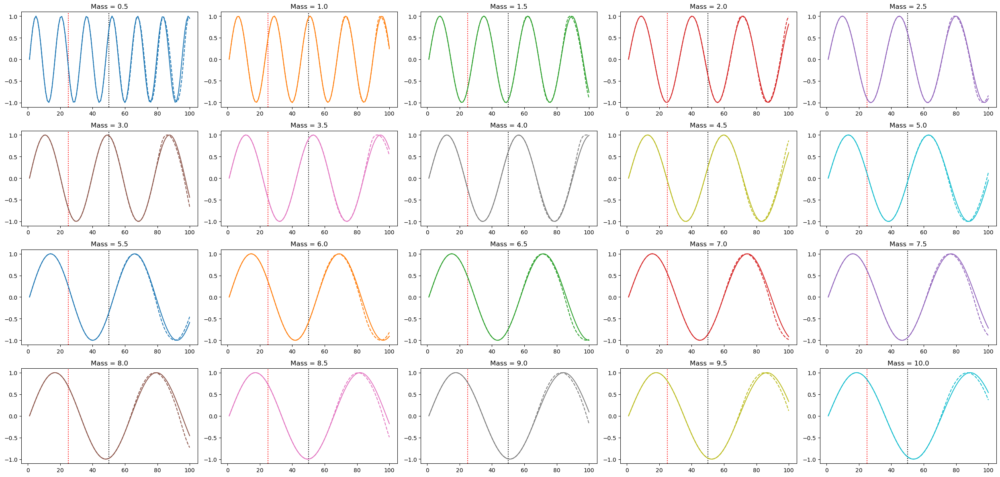

In [216]:
import math

xref = x.squeeze(-1)
xpred = xcurr.squeeze(-1)
tref = np.arange(xref.shape[-1])+1
tpred = np.arange(xpred.shape[-1])+1

masses = val_data.masses
n_mass = len(masses)
n_col = 5
n_row = math.ceil(n_mass/n_col)

fig,axes = plt.subplots(n_row,n_col,figsize=(5*n_col,3*n_row))

for idx in range(xref.shape[0]):
    irow = idx//n_col
    icol = idx % n_col
    plt.sca(axes[irow,icol])
    plt.plot(tref,xref[idx:idx+1].T,color=f"C{idx}",zorder=1)
    plt.plot(tpred,xpred[idx:idx+1].T,linestyle='--',color=f"C{idx}",zorder=1)
    plt.title(f"Mass = {masses[idx]:.1f}")
    plt.axvline(50,color='k',linestyle=':',zorder=0)
    plt.axvline(tstart,color='r',linestyle=":",zorder=0)
plt.tight_layout()
#plt.savefig("allMasses_timeSeries_smallTest_noPosEnc.png")